<a href="https://www.kaggle.com/code/angevalli/analysis-of-video-and-tracking?scriptVersionId=132243353" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/videos-for-object-tracking/ball_cascade.xml
/kaggle/input/videos-for-object-tracking/Test-Videos/Mug.mp4
/kaggle/input/videos-for-object-tracking/Test-Videos/VOT-Sunshade.mp4
/kaggle/input/videos-for-object-tracking/Test-Videos/VOT-Ball.mp4
/kaggle/input/videos-for-object-tracking/Test-Videos/VOT-Basket.mp4
/kaggle/input/videos-for-object-tracking/Test-Videos/VOT-Woman.mp4
/kaggle/input/videos-for-object-tracking/Test-Videos/VOT-Car.mp4


In [2]:
from typing import List, Dict
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [3]:
%cd "/kaggle/input/videos-for-object-tracking/"

/kaggle/input/videos-for-object-tracking


# Parameters

In [4]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

# Video capture

Select the video on which you want to test

In [5]:
video: str = [
    #"Test-Videos/VOT-Woman.mp4",
    #"Test-Videos/VOT-Ball.mp4",
    "Test-Videos/Mug.mp4",
    #"Test-Videos/VOT-Car.mp4",
    #"Test-Videos/VOT-Sunshade.mp4",
    #"Test-Videos/VOT-Basket.mp4"
][0]

In [6]:
cap = cv2.VideoCapture(video)
total_nb_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))-1
# take first frame of the video
ret, frame = cap.read()
# load the image, clone it
clone = frame.copy()

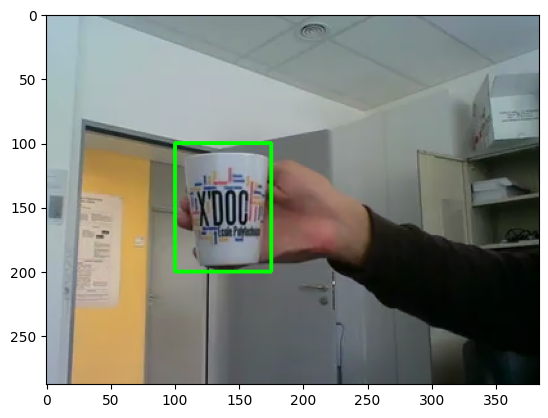

In [7]:
# OpenCV opens images as BRG 
# but we want it as RGB We'll 
# also need a grayscale version
img_gray = cv2.cvtColor(clone, cv2.COLOR_BGR2GRAY)
img_rgb = cv2.cvtColor(clone, cv2.COLOR_BGR2RGB)

if video in ["Test-Videos/VOT-Woman.mp4", "Test-Videos/VOT-Sunshade.mp4"]:
    # Use HOG Descriptor:
    hog = cv2.HOGDescriptor()
    hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
    found, _ = hog.detectMultiScale(img_rgb, winStride=(8,8))
    thickness = 2

elif video == "Test-Videos/Mug.mp4":
    found = np.array([[100, 100, 75, 100]])
    thickness = 2

elif video == "Test-Videos/VOT-Car.mp4":
    found = np.array([(220, 150, 160, 140)])
    thickness = 2

elif video == "Test-Videos/VOT-Ball.mp4":
    # Use minSize because for not 
    # bothering with extra-small 
    # dots that would look like STOP signs
    ball_data = cv2.CascadeClassifier("ball_cascade.xml")
    found = ball_data.detectMultiScale(img_gray)
    thickness = 5

# Don't do anything if there's 
# no sign
amount_found = len(found)

if amount_found != 0:

    # There may be more than one
    # sign in the image
    for (x, y, height, width) in found:

        # We draw a green rectangle around
        # every recognized sign
        cv2.rectangle(img_rgb, (x, y), 
                      (x + height, y + width), 
                      (0, 255, 0), thickness)

# Creates the environment of 
# the picture and shows it
plt.subplot(1, 1, 1)
plt.imshow(img_rgb)
plt.show()

In [8]:
r, c, h, w = found[0,0], found[0,1], found[0,2], found[0,3]
frames: Dict[str, List] = {"Gradient norm": [],
                           "Local orientation": [],
                           "Significant local orientation": [],
                           "Hough Transform": [],
                           "Sequence": []}

In [9]:
pause_time = 1
track_window = (r, c, h, w)
# set up the ROI for tracking
roi = frame[c:c+w, r:r+h]
# conversion to Hue-Saturation-Value space
# 0 < H < 180 ; 0 < S < 255 ; 0 < V < 255
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
# computation mask of the histogram:
# Pixels with S<30, V<20 or V>235 are ignored
mask = cv2.inRange(hsv_roi, np.array((0., 30., 20.)), np.array((180., 255., 235.)))
# Marginal histogram of the Hue component
roi_hist = cv2.calcHist([hsv_roi], [1], mask, [180], [0, 180])  # CHANGER LE CHANNEL AUSSI
# Histogram values are normalised to [0,255]
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)
current_hist = roi_hist
# Setup the termination criteria: either 10 iterations,
# or move by less than 1 pixel
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)

cpt = 1
treshold = 0.8 # Treshold defined to keep only pixels with significant orientation

for _ in range(total_nb_frames):
    ret, frame = cap.read()

    if ret == True:
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

# Mean-Shift algorithm
        # Determination of local orientation and gradient norm
        #frame_current = np.divide(hsv[:,:,2],255)
        frame_current = np.divide(hsv[:, :, 2], 255)
        grad = cv2.Sobel(frame_current, cv2.CV_64F, 1, 0), cv2.Sobel(frame_current, cv2.CV_64F, 0, 1)
        norm_grad = np.sqrt(grad[1]**2 + grad[0]**2)  # Norm of gradient
        frames["Gradient norm"].append(norm_grad)

        arg_grad_treshold = cv2.convertScaleAbs(np.arctan2(grad[1], grad[0]), alpha=255/np.pi)  # Local orientation
        frames["Local orientation"].append(arg_grad_treshold)
        arg_grad_treshold[norm_grad < treshold] = arg_grad_treshold if False else 0 # If we exceed the treshold, then we go to 0
        frames["Significant local orientation"].append(arg_grad_treshold)

# Definition of the R-Table
        Ligne_index = dict()
        Rtable = [[] for _ in range(180)]
        converted_args = (np.arctan2(grad[1], grad[0]) + np.pi)*180/np.pi
        for i in range(r, r+h-1):
            for j in range(c, c+w-1):
                if arg_grad_treshold[j, i] :
                    Ligne_index[(i,j)] = (int(converted_args[j, i])+1)//2 - 1 if (int(converted_args[j, i]) + 1) % 2 else (int(converted_args[j, i])+2)//2 - 1 # We classfy the angle within the 180 samples of the Rtable
                    Rtable[Ligne_index[(i,j)]] += [(c+w//2-j, r+h//2-i)]
        
# Definition of Hough tranform
        frame_width, frame_length = frame_current.shape
        votes_table = np.zeros((frame_width, frame_length), dtype=np.float32)
        for i in range(frame_length-1) :
            for j in range(frame_width-1) :
                if arg_grad_treshold[j, i]: # If the current pixel is voting
                    if (i,j) in Ligne_index.keys() :
                    	Ligne = Ligne_index[(i,j)] # We do not recompute the index for pixels we already computed at the construction of the Rtable
                    else :
                    	Ligne = (int(converted_args[j, i])+1)//2 - 1 if (int(converted_args[j, i]) + 1) % 2 else (int(converted_args[j, i])+2)//2 - 1 # We identify the corresponding line in the R-Table
                    for pixel_coordinates in Rtable[Ligne] : # For each pixel in the R-Table
                        ind_width, ind_length = i + pixel_coordinates[1], j + pixel_coordinates[0]
                        if 0 <= ind_width < frame_width and 0 <= ind_length < frame_length : # If the coordinates are in the image
                            votes_table[ind_width,ind_length] += 1 # We increment the number of votes of the corresponding pixel
        frames["Hough Transform"].append(votes_table)

        
        # apply meanshift to votes_table to get the new location
        normalized_votes = np.divide(votes_table,votes_table.argmax()) # We normalise to limit the computation time on the meanshift
        ret, track_window = cv2.meanShift(normalized_votes, track_window, term_crit)
        
        # Draw a blue rectangle on the current image
        r, c, h, w = track_window
        frame_tracked = cv2.rectangle(frame, (r, c), (r+h, c+w), (255, 0, 0), 2)
        frames["Sequence"].append(frame_tracked)

# Update strategy for history
        frame_tracked_for_roi_hist = frame_tracked[c:c+w, r:r+h]
        hsv_tracked = cv2.cvtColor(frame_tracked_for_roi_hist, cv2.COLOR_BGR2HSV)
        mask_tracked = cv2.inRange(hsv_tracked, np.array((0., 30., 20.)), np.array((180., 255., 235.)))
        roi_hist = cv2.calcHist([hsv_tracked], [1], mask_tracked, [180], [0, 180]) # Joint histogram [0,1], Marginal shade histogram [0] or marginal saturation histogram [1]
        cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)

cap.release()

In [10]:
from matplotlib import rc
rc('animation', html='jshtml')

fig, axes = plt.subplots(nrows=len(frames), ncols=1)
plt.tight_layout()
# line, = axes[3].plot([], [], linewidth=5)
# for i, ax in enumerate(axes):
#     ax.set_ylim(0, 13)
#     ax.set_xlim(-1, 10)

def animate(i):
    # Plot 1 : Gradient norm
    axes[0].set_title("Plot 1: Gradient norm")
    axes[0].imshow(frames["Gradient norm"][i])
    # Plot 2 : Local orientation
    axes[1].set_title("Plot 2: Local orientation")
    axes[1].imshow(frames["Local orientation"][i])
    # Plot 3 : Significant local orientation
    axes[2].set_title("Plot 3: Significant local orientation")
    axes[2].imshow(frames["Significant local orientation"][i])
    # Plot 4 : Hough Transform
    axes[3].set_title("Plot 4: Hough Transform")
    axes[3].imshow(frames["Hough Transform"][i])
    # Plot 5 : Sequence
    axes[4].set_title("Plot 5: Sequence")
    axes[4].imshow(frames["Sequence"][i])

# Code to prevent a static image from being generated from this cell
plt.close()

In [11]:
import matplotlib.animation as animation
anim = animation.FuncAnimation(fig, animate, frames=total_nb_frames, blit=False)
anim